In [64]:
######## IMPORTS #########

import numpy as np
import pandas as pd
import scipy.stats
import datetime
import os
import plotly.express as px
import plotly.io as pio
import warnings
import webbrowser
from fitter import Fitter
from scipy.stats import norm
import random
from math import *
import matplotlib.pyplot as plt
import scipy.special as spe
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.preprocessing import MinMaxScaler
from minisom import MiniSom
from tslearn.barycenters import dtw_barycenter_averaging
from tslearn.clustering import TimeSeriesKMeans
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error 

import seaborn as sns
import array as arr
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import matplotlib.pyplot as plt


C:\Program64\Python\Python\lib\site-packages\tslearn\bases\bases.py:15: UserWarning:

h5py not installed, hdf5 features will not be supported.
Install h5py to use hdf5 features: http://docs.h5py.org/



In [39]:
all_df.to_csv("merged_cleaned_data_5.csv")

In [7]:
#### renaming columns

values = { "AGG" : "IG_US_AGG_ETF" ,  
          "BND" : "Vanguard_bnd_ETF", 
          "TLT" : "LT_Treasury_bnd_1_ETF", 
          "IEF" : "MT_Treasury_bnd_ETF",
          "SHY" : "ST_Treasury_bnd_1_ETF", 
          "LQD" : "IG_US_LQD_ETF" ,
          "HYG" : "HY_iShares_ETF", 
          "JNK" : "HY_BBG_ETF",
          "MUB" : "US_MUNI_ETF",
          "TIP" : "TIPS_ETF", 
          "IEI" :  "ST_Treasury_bnd_ETF2",
          "TLH" : "MT_Treasury_bnd_2_ETF",
          "SPTL" :  "LT_Treasury_bnd_2_ETF", 
          "VGLT" : "LT_Treasury_bnd_Vanguard_ETF", 
          "SCHO" : "ST_Treasury_bnd_Schwab_ETF",
          "SCHR" : "MT_Treasury_bnd_Schwab_ETF",
          "SPTS" : "ST_Treasury_bnd_SPDR_ETF",
          "GSPC" : "SP500",
          "ES=F" : "SP500 _FUT",
          "NQ=F" : "NASDAQ _FUT",   
          "YM=F" : "DOWJONES_FUT", 
          "RTY=F" : "RUSSELL_FUT",
          "ZB=F" : "30YUS_FUT",
          "GC=F" : "GOLD_FUT",
          "SI=F" : "SILVER_FUT",   
          "CL=F" : "CRUDE_OIL_FUT",   
         }
for k,v in values.items() : 
    all_df.columns = all_df.columns.str.replace(k, v,  regex=True)

all_df


,Date,Open,High,Low,Close*,Adj Close**,Volume,IG_US_AGG_ETF_Open,IG_US_AGG_ETF_High,IG_US_AGG_ETF_Low,...,MT_Treasury_bnd_Schwab_ETF_Stock Splits,MT_Treasury_bnd_Schwab_ETF_Capital Gains,ST_Treasury_bnd_SPDR_ETF_Open,ST_Treasury_bnd_SPDR_ETF_High,ST_Treasury_bnd_SPDR_ETF_Low,ST_Treasury_bnd_SPDR_ETF_Close,ST_Treasury_bnd_SPDR_ETF_Volume,ST_Treasury_bnd_SPDR_ETF_Dividends,ST_Treasury_bnd_SPDR_ETF_Stock Splits,ST_Treasury_bnd_SPDR_ETF_Capital Gains
0,2023-03-30,32807.43,32905.80,32682.87,32859.03,32859.03,283380000,93.4765,93.6653,93.4010,...,0.0,0.0,27.2735,27.3109,27.2735,27.2922,10123100,0.000,0.0,0.0
1,2023-03-29,32566.54,32728.04,32539.94,32717.60,32717.60,314110000,93.2028,93.5520,93.1839,...,0.0,0.0,27.2922,27.3296,27.2828,27.2922,2589900,0.000,0.0,0.0
2,2023-03-28,32434.85,32551.01,32295.50,32394.25,32394.25,248560000,93.4293,93.4954,93.2782,...,0.0,0.0,27.3296,27.3389,27.3015,27.3202,3401100,0.000,0.0,0.0
3,2023-03-27,32276.72,32564.00,32276.72,32432.08,32432.08,291560000,93.8163,93.9390,93.5142,...,0.0,0.0,27.3764,27.3857,27.3389,27.3483,6032700,0.000,0.0,0.0
4,2023-03-24,32038.22,32257.24,31805.18,32237.53,32237.53,317070000,94.6564,94.8546,94.3449,...,0.0,0.0,27.5167,27.5354,27.4418,27.4605,2642700,0.000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1233,2018-05-07,24317.66,24479.45,24263.42,24357.32,24357.32,307670000,89.0870,89.0870,88.9944,...,0.0,0.0,25.8982,25.8982,25.8894,25.8982,109400,0.000,0.0,0.0
1234,2018-05-04,23865.22,24333.35,23778.87,24262.51,24262.51,329480000,89.1206,89.1291,88.9439,...,0.0,0.0,25.8894,25.9069,25.8718,25.8894,325700,0.000,0.0,0.0
1235,2018-05-03,23836.23,23996.15,23531.31,23930.15,23930.15,389240000,89.0365,89.1458,89.0028,...,0.0,0.0,25.8982,25.9069,25.8894,25.8982,41100,0.000,0.0,0.0
1236,2018-05-02,24097.63,24185.52,23886.30,23924.98,23924.98,385350000,88.9355,89.0028,88.8682,...,0.0,0.0,25.8718,25.8894,25.8718,25.8894,132000,0.000,0.0,0.0


In [37]:
for i in all_df.columns : 
    if( i [-1] == "y") : 
        all_df.drop(i, inplace = True, axis =1)
    if (len(i)> 15):
        if (i[-15:] == "Capital Gains_x") | (i[-13:] == "Capital Gains")| (i[-15:] == "Capital Gains_x")| (i[-15:] == "Stock Splits_x") | (i [-12:] == "Stock Splits") | (i [-11:] == "Dividends_x")  | (i[-9:] == "Dividends"):
            print(i)
            all_df.drop(i, inplace = True, axis =1)
        

IG_US_AGG_ETF_Dividends
IG_US_AGG_ETF_Stock Splits
IG_US_AGG_ETF_Capital Gains
Vanguard_bnd_ETF_Dividends
Vanguard_bnd_ETF_Stock Splits
Vanguard_bnd_ETF_Capital Gains
LT_Treasury_bnd_1_ETF_Dividends_x
LT_Treasury_bnd_1_ETF_Capital Gains_x
MT_Treasury_bnd_ETF_Dividends_x
MT_Treasury_bnd_ETF_Capital Gains_x
ST_Treasury_bnd_1_ETF_Dividends_x
ST_Treasury_bnd_1_ETF_Capital Gains_x
IG_US_LQD_ETF_Dividends
IG_US_LQD_ETF_Stock Splits
IG_US_LQD_ETF_Capital Gains
HY_iShares_ETF_Dividends
HY_iShares_ETF_Stock Splits
HY_iShares_ETF_Capital Gains
HY_BBG_ETF_Dividends
HY_BBG_ETF_Stock Splits
HY_BBG_ETF_Capital Gains
US_MUNI_ETF_Dividends
US_MUNI_ETF_Stock Splits
US_MUNI_ETF_Capital Gains
TIPS_ETF_Dividends
TIPS_ETF_Stock Splits
TIPS_ETF_Capital Gains
^SP500_Dividends
^SP500_Stock Splits
SP500 _FUT_Dividends
SP500 _FUT_Stock Splits
NASDAQ _FUT_Dividends
NASDAQ _FUT_Stock Splits
DOWJONES_FUT_Dividends
DOWJONES_FUT_Stock Splits
RUSSELL_FUT_Dividends
RUSSELL_FUT_Stock Splits
30YUS_FUT_Dividends
30YUS_FU

In [2]:
### Loading all cleaned data

all_df = pd.read_csv("merged_cleaned_data_5.csv")


1238

In [3]:
# studying daily variations

stud = all_df.set_index("Date").filter(regex= "Open")
stud = stud.diff() /stud #variation relative
stud.fillna(0,inplace= True)
stud.info()


<class 'pandas.core.frame.DataFrame'>
Index: 1238 entries, 2023-03-30 to 2018-05-01
Data columns (total 27 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Open                               1238 non-null   float64
 1   IG_US_AGG_ETF_Open                 1238 non-null   float64
 2   Vanguard_bnd_ETF_Open              1238 non-null   float64
 3   LT_Treasury_bnd_1_ETF_Open_x       1238 non-null   float64
 4   MT_Treasury_bnd_ETF_Open_x         1238 non-null   float64
 5   ST_Treasury_bnd_1_ETF_Open_x       1238 non-null   float64
 6   IG_US_LQD_ETF_Open                 1238 non-null   float64
 7   HY_iShares_ETF_Open                1238 non-null   float64
 8   HY_BBG_ETF_Open                    1238 non-null   float64
 9   US_MUNI_ETF_Open                   1238 non-null   float64
 10  TIPS_ETF_Open                      1238 non-null   float64
 11  ^SP500_Open                        1238 non-nu

Text(0.5, 1.0, 'Correlation Heatmap')

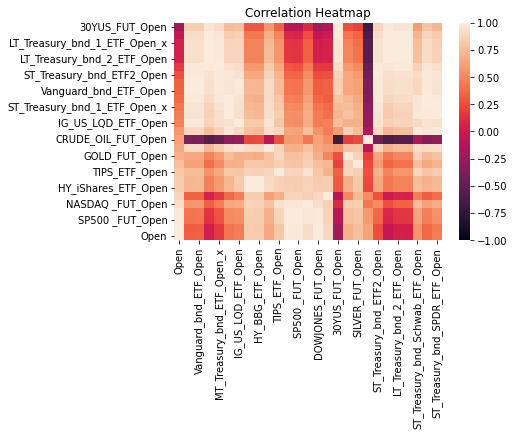

In [21]:
# correlation map

heatmap = sns.heatmap(all_df.set_index("Date").filter(regex= "Open").corr().sort_values(by="Open"), vmin=-1, vmax=1)
heatmap.set_title('Correlation Heatmap')

In [22]:

# checking on the correlation values
all_df.set_index("Date").filter(regex= "Open").corr().sort_values(by="Open", ascending= False)


,Open,IG_US_AGG_ETF_Open,Vanguard_bnd_ETF_Open,LT_Treasury_bnd_1_ETF_Open_x,MT_Treasury_bnd_ETF_Open_x,ST_Treasury_bnd_1_ETF_Open_x,IG_US_LQD_ETF_Open,HY_iShares_ETF_Open,HY_BBG_ETF_Open,US_MUNI_ETF_Open,...,GOLD_FUT_Open,SILVER_FUT_Open,CRUDE_OIL_FUT_Open,ST_Treasury_bnd_ETF2_Open,MT_Treasury_bnd_2_ETF_Open,LT_Treasury_bnd_2_ETF_Open,LT_Treasury_bnd_Vanguard_ETF_Open,ST_Treasury_bnd_Schwab_ETF_Open,MT_Treasury_bnd_Schwab_ETF_Open,ST_Treasury_bnd_SPDR_ETF_Open
Open,1.000000,0.331008,0.336813,0.038086,0.177770,0.427293,0.467165,0.839198,0.834051,0.648472,...,0.697735,0.768426,0.621409,0.268557,-0.026961,0.048300,0.046803,0.563197,0.371305,0.454188
DOWJONES_FUT_Open,0.999081,0.319983,0.325662,0.026487,0.166478,0.417402,0.456830,0.833069,0.828041,0.641223,...,0.692903,0.764559,0.626903,0.257482,-0.038492,0.036706,0.035225,0.554972,0.360910,0.444440
SP500 _FUT_Open,0.981605,0.408823,0.414713,0.142822,0.272968,0.509377,0.529987,0.841962,0.837040,0.693122,...,0.767194,0.795418,0.588576,0.355236,0.071237,0.152816,0.151355,0.638759,0.459742,0.536180
^SP500_Open,0.980892,0.417095,0.423018,0.151919,0.281633,0.516549,0.537496,0.846007,0.841055,0.698051,...,0.769420,0.797557,0.583400,0.363642,0.080429,0.161861,0.160390,0.644289,0.467350,0.543157
NASDAQ _FUT_Open,0.922612,0.565796,0.571688,0.328243,0.449557,0.656517,0.664790,0.868276,0.863808,0.786476,...,0.830434,0.851329,0.431947,0.525143,0.259215,0.338000,0.336474,0.758014,0.617268,0.679164
RUSSELL_FUT_Open,0.895586,0.337877,0.343645,0.052243,0.170416,0.377557,0.467794,0.829678,0.837788,0.603061,...,0.494105,0.733531,0.531164,0.268225,0.002500,0.056627,0.054630,0.456169,0.325318,0.394460
HY_iShares_ETF_Open,0.839198,0.727280,0.730722,0.474949,0.588615,0.732898,0.826902,1.000000,0.998998,0.907133,...,0.697151,0.816941,0.231647,0.656809,0.435056,0.481423,0.479883,0.772543,0.703740,0.743019
HY_BBG_ETF_Open,0.834051,0.723115,0.726592,0.472445,0.582725,0.722575,0.822920,0.998998,1.000000,0.899089,...,0.679183,0.812760,0.237116,0.650630,0.433525,0.478206,0.476609,0.757688,0.694057,0.731973
TIPS_ETF_Open,0.807824,0.742698,0.746896,0.555260,0.661141,0.815849,0.804647,0.864543,0.857075,0.881756,...,0.896157,0.845448,0.272642,0.714732,0.490088,0.564982,0.563855,0.883934,0.792476,0.833107
SILVER_FUT_Open,0.768426,0.618719,0.624034,0.396663,0.516654,0.687686,0.703001,0.816941,0.812760,0.789817,...,0.862414,1.000000,0.241217,0.592092,0.346198,0.408005,0.406491,0.759401,0.659552,0.703211


limit_output extension: Maximum message size of 10000 exceeded with 30278 characters

In [62]:


#####  construction the EWMA modified data
all_df.sort_values(by= "Date", inplace = True)
stud = all_df.set_index("Date").filter(regex= "Open")
stud = stud.diff() /stud #variation relative
stud.dropna(inplace= True)
stud

def ewm(y, alpha):
    cur_ewm = np.zeros([len(y)])
    cur_ewm[0] = y[0]
    for i in range(1, len(y)):
        cur_ewm[i] = alpha * y[i] + (1-alpha)*cur_ewm[i-1]
    return cur_ewm  

EWMA = stud.ewm(alpha = 0.8).mean().corr()
EWMA
alphas = [0.1, 0.3, 0.5, 0.8, 1]

fig = go.Figure()
dictio = {}
for a in alphas : 
    print(a)
    EWMA = stud.ewm(alpha = a).mean().corr()
    dictio[a] = EWMA["Open"]
#     fig.add_trace(go.Bar(EWMA))

fig = px.bar(dictio, barmode="group", title = "Variation of the Correlation with different values of alpha in the EWMA model")
# Change legend title
fig.update_layout(legend_title_text='alpha values')
fig.update_yaxes(title_text="Correlation with Open")
# fig.show()
# heatmap = sns.heatmap(EWMA.sort_values(by="Open"), vmin=-1, vmax=1)
# heatmap.set_title('Correlation Heatmap with EWMA alpha = 0.8')

0.1
0.3
0.5
0.8
1


In [27]:
EWMA.sort_values(by="Open", ascending= False)

,Open,IG_US_AGG_ETF_Open,Vanguard_bnd_ETF_Open,LT_Treasury_bnd_1_ETF_Open_x,MT_Treasury_bnd_ETF_Open_x,ST_Treasury_bnd_1_ETF_Open_x,IG_US_LQD_ETF_Open,HY_iShares_ETF_Open,HY_BBG_ETF_Open,US_MUNI_ETF_Open,...,GOLD_FUT_Open,SILVER_FUT_Open,CRUDE_OIL_FUT_Open,ST_Treasury_bnd_ETF2_Open,MT_Treasury_bnd_2_ETF_Open,LT_Treasury_bnd_2_ETF_Open,LT_Treasury_bnd_Vanguard_ETF_Open,ST_Treasury_bnd_Schwab_ETF_Open,MT_Treasury_bnd_Schwab_ETF_Open,ST_Treasury_bnd_SPDR_ETF_Open
Open,1.000000,0.140860,0.160347,-0.183370,-0.144549,-0.115055,0.355381,0.663394,0.673416,0.279521,...,0.108647,0.202348,0.030038,-0.121211,-0.169711,-0.178723,-0.187334,-0.108714,-0.133408,-0.100197
^SP500_Open,0.932911,0.144349,0.155069,-0.163971,-0.112379,-0.087882,0.357513,0.691400,0.706787,0.247591,...,0.115800,0.206085,0.035308,-0.092414,-0.142435,-0.161882,-0.170057,-0.083556,-0.099899,-0.079334
DOWJONES_FUT_Open,0.780510,0.113000,0.099195,-0.080366,-0.051256,-0.032796,0.171781,0.358345,0.395915,0.222246,...,0.121788,0.240831,0.038641,-0.073182,-0.080853,-0.092127,-0.098443,-0.033545,-0.054850,-0.069632
SP500 _FUT_Open,0.752214,0.114957,0.106514,-0.071120,-0.038761,-0.027576,0.188036,0.384589,0.424140,0.201630,...,0.128792,0.240909,0.035513,-0.056767,-0.066728,-0.081009,-0.087719,-0.028232,-0.040213,-0.056127
RUSSELL_FUT_Open,0.702629,0.115618,0.099069,-0.085999,-0.062184,-0.058085,0.190020,0.382509,0.424360,0.205291,...,0.126023,0.242300,0.063659,-0.080331,-0.087051,-0.092830,-0.099598,-0.061952,-0.061271,-0.081057
HY_BBG_ETF_Open,0.673416,0.303834,0.309182,-0.066024,0.016349,0.034391,0.612048,0.984854,1.000000,0.434957,...,0.105950,0.178209,0.001155,0.058260,-0.031835,-0.059269,-0.063847,0.023786,0.036838,0.041827
HY_iShares_ETF_Open,0.663394,0.296255,0.299391,-0.075224,0.009961,0.032799,0.616152,1.000000,0.984854,0.429379,...,0.102851,0.172293,0.009320,0.055675,-0.038472,-0.068227,-0.073268,0.025352,0.029104,0.050815
NASDAQ _FUT_Open,0.647354,0.114956,0.105017,-0.035175,-0.010963,-0.015949,0.177470,0.346010,0.380692,0.155149,...,0.135988,0.230845,0.025407,-0.030919,-0.025721,-0.040657,-0.049345,-0.010829,-0.012378,-0.038129
IG_US_LQD_ETF_Open,0.355381,0.820823,0.838807,0.584260,0.592656,0.412524,1.000000,0.616152,0.612048,0.659929,...,0.201577,0.211356,-0.003120,0.562699,0.602418,0.592908,0.589870,0.392003,0.569467,0.388554
US_MUNI_ETF_Open,0.279521,0.623355,0.638073,0.400663,0.360639,0.258891,0.659929,0.429379,0.434957,1.000000,...,0.243046,0.197637,-0.028556,0.338811,0.384749,0.412525,0.407172,0.224462,0.348310,0.226360


limit_output extension: Maximum message size of 10000 exceeded with 30278 characters

In [5]:
fig = go.Figure(
for i in stud.columns :
    fig = fig.add_trace(go.Scatter(x= stud.index.values, y=stud[i] ,name=i, mode="lines"))
fig.show()
    
fig2 = go.Figure()
for i in stud.columns :
    if "CRUDE_OIL_FUT" not in i:
        fig2 = fig2.add_trace(go.Scatter(x= stud.index.values, y=stud[i] ,name=i, mode="lines"))
        
fig2.update_layout(title = "Variation analysis over time for all the Yahoo Tickers")      
fig2.show()

In [65]:

### working on clustering
# DBA-k-means
def clustering_dba_kmeans(data, n_clusters): # on veut un cluster par jour par univers
    
    
    dba_km = TimeSeriesKMeans(n_clusters,
    n_init=1,
    metric="dtw",
    verbose=True,
    max_iter_barycenter=10)
    
    y_pred = dba_km.fit(data.transpose())
    
    fig_cluster = go.Figure()
    
    dic= {}
    
    #print clusters
    for yi in range(n_clusters):
        dic[yi] = dba_km.cluster_centers_[yi].ravel()
        print(yi) 
        fig_cluster = fig_cluster.add_trace(go.Scatter(x = stud.index.values, y = dic[yi] , name="cluster"+str(yi), mode="lines"))
    fig_cluster.update_layout(title="DBA k-means clustering")
    fig_cluster.show()

    dic_prop ={}
    test = dba_km.fit_predict(data.transpose(), y=None)    
    
    x = test
    
#     for i in np.unique(test):
#         y = x.count(i) /len(x)
#         dic_prop[i] = y
#         print("The proportion of cluster "+ str(i) +" is "+ str(round(y,2)*100) + "%")
        
    results = pd.DataFrame(dic)

    return(results, dic_prop, x)

res = clustering_dba_kmeans(stud.drop(["CRUDE_OIL_FUT_Open"], axis=1), 3) # we exclude this column because of extreme behavior
res[2]

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  26 out of  26 | elapsed:    2.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  78 out of  78 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  78 out of  78 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  78 out of  78 | elapsed:    2.6s finished


0.033 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  78 out of  78 | elapsed:    1.8s finished


0.024 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  78 out of  78 | elapsed:    1.7s finished


0.024 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


0
1
2


[Parallel(n_jobs=1)]: Done  78 out of  78 | elapsed:    1.3s finished


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  26 out of  26 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  78 out of  78 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  78 out of  78 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  78 out of  78 | elapsed:    1.3s finished


0.036 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  78 out of  78 | elapsed:    1.4s finished


0.026 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  78 out of  78 | elapsed:    1.4s finished


0.026 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  78 out of  78 | elapsed:    1.3s finished


array([2, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 2, 1, 1, 1, 1, 2, 2, 1, 0, 2, 2,
       2, 0, 0, 0], dtype=int64)

In [66]:
# columns to keep (belonging to the same cluster as Open)

truc = res[2]
col_to_keep = []
all_cols = stud.drop(["CRUDE_OIL_FUT_Open"], axis= 1).columns
k=0
for i in truc==2 :
    if i :
        col_to_keep.append (all_cols[k])
        
    k+=1
col_to_keep  

['Open',
 'LT_Treasury_bnd_1_ETF_Open_x',
 'IG_US_LQD_ETF_Open',
 'HY_iShares_ETF_Open',
 'HY_BBG_ETF_Open',
 '^SP500_Open',
 '30YUS_FUT_Open',
 'GOLD_FUT_Open',
 'MT_Treasury_bnd_2_ETF_Open',
 'LT_Treasury_bnd_2_ETF_Open',
 'LT_Treasury_bnd_Vanguard_ETF_Open']

Coefficients:
['HY_iShares_ETF_Open', 'HY_BBG_ETF_Open', '^SP500_Open'] [ 0.28  -0.184  0.894]
Intercept: [-4.9e-05]
R² Score: 0.8597
Mean Squared Error: 1.6e-05


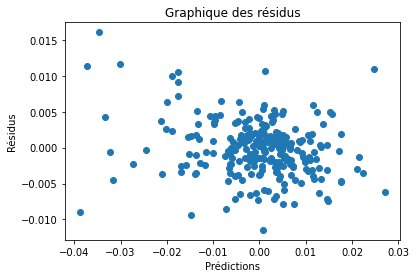

In [86]:

# divide data into train and test
X_train, X_test, y_train, y_test = train_test_split(stud[[ 'HY_iShares_ETF_Open','HY_BBG_ETF_Open','^SP500_Open']], stud[["Open"]], test_size=0.2, random_state=42)

# training model
model = LinearRegression()
model.fit(X_train, y_train)

# predicting
y_pred = model.predict(X_test)

# evaluate the model
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)

# printing results
print("Coefficients:")
for name, coef in zip([[ 'HY_iShares_ETF_Open','HY_BBG_ETF_Open','^SP500_Open']], model.coef_):
    print(name, coef.round(3))
print(f"Intercept: {model.intercept_.round(6)}")
print(f"R² Score: {r2:.4f}")
print(f"Mean Squared Error: {mse.round(6)}")

# Visualiser les résidus
plt.scatter(y_pred, y_test - y_pred)
plt.xlabel("Prédictions")
plt.ylabel("Résidus")
plt.title("Graphique des résidus")
plt.show()

{'Slope': array([[0.37675515],
       [0.36939507],
       [0.9375864 ]]), 'Intercept': array([-7.44339241e-06, -7.48192756e-06,  1.05563082e-04]), 'R-Squared': 0.5667652983602577}


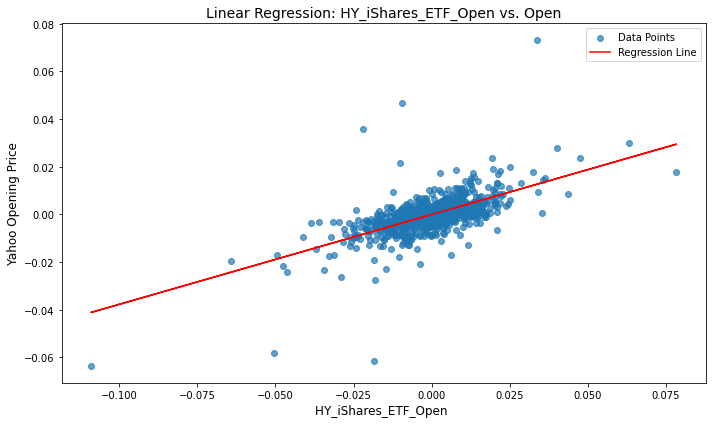

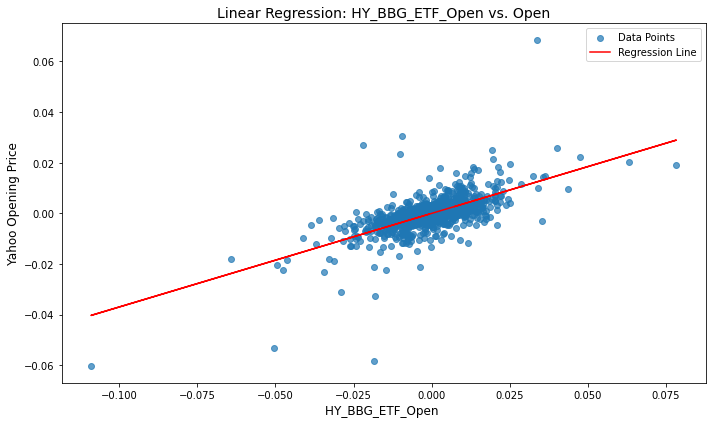

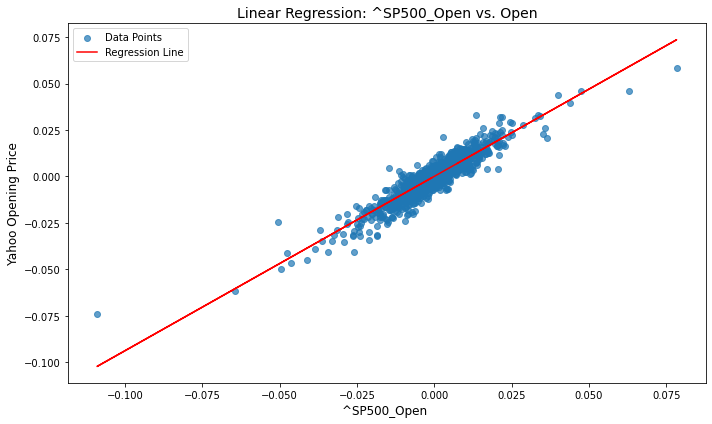

In [79]:
### linear regression 

regression_results = []  
#go through each of the other "open" columns to regress against Yahoo's opening price

#X is the independent variable (i.e. current "Open" column) and Y is the dependent variable (Yahoo's opening price)

# Prepare the data
X = stud[["Open"]]
y = stud[[ 'HY_iShares_ETF_Open','HY_BBG_ETF_Open','^SP500_Open']]
model = LinearRegression()
model.fit(X, y)
slope = model.coef_
intercept = model.intercept_
r_squared = model.score(X, y)
print({ 'Slope': slope, 'Intercept': intercept, 'R-Squared': r_squared})

for yy in y.columns :

    # Initialise and fit the regression model
    model = LinearRegression()
    model.fit(X, stud[yy])
    slope = model.coef_
    intercept = model.intercept_
    r_squared = model.score(X, stud[yy])
    # Save results
    # regression_results.append({'Ticker': col, 'Slope': slope, 'Intercept': intercept, 'R-Squared': r_squared})

    # Plot the regression
    plt.figure(figsize=(10, 6))
    plt.scatter(X, stud[yy], label='Data Points', alpha=0.7)
    plt.plot(X, model.predict(X), color='red', label='Regression Line')
    plt.title(f"Linear Regression: {yy} vs. Open", fontsize=14)
    plt.xlabel(f"{yy} ", fontsize=12)
    plt.ylabel(f"Yahoo Opening Price", fontsize=12)
    plt.legend()
    plt.tight_layout()
    plt.show()